# Retrieve Data

In [1]:
from google.colab import auth
auth.authenticate_user()

project_id = 'spearsx'
!gcloud config set project {project_id}

!gsutil -m cp gs://chesspic-assets/datasets/2022-04-01-unity-starting-pos-test-dataset.zip .
!gsutil -m cp gs://chesspic-assets/datasets/2023-02-14-cropped-corrected-resized-400x400.zip .
!gsutil -m cp gs://chesspic-assets/datasets/2023-02-18-cropped-video-test-set-resized-400x400.zip .
!unzip -q 2022-04-01-unity-starting-pos-test-dataset.zip -d unity
!unzip -q 2023-02-14-cropped-corrected-resized-400x400.zip -d real
!unzip -q 2023-02-18-cropped-video-test-set-resized-400x400.zip -d video

Updated property [core/project].
Copying gs://chesspic-assets/datasets/2022-04-01-unity-starting-pos-test-dataset.zip...
==> NOTE: You are downloading one or more large file(s), which would
run significantly faster if you enabled sliced object downloads. This
feature is enabled by default but requires that compiled crcmod be
installed (see "gsutil help crcmod").

\ [1/1 files][  1.4 GiB/  1.4 GiB] 100% Done  84.6 MiB/s ETA 00:00:00           
Operation completed over 1 objects/1.4 GiB.                                      
Copying gs://chesspic-assets/datasets/2023-02-14-cropped-corrected-resized-400x400.zip...
==> NOTE: You are downloading one or more large file(s), which would
run significantly faster if you enabled sliced object downloads. This
feature is enabled by default but requires that compiled crcmod be
installed (see "gsutil help crcmod").

- [1/1 files][287.5 MiB/287.5 MiB] 100% Done                                    
Operation completed over 1 objects/287.5 MiB.          

In [2]:
REAL_DIR = "/content/real/2023-02-14-cropped-corrected-resized-400x400"
UNITY_DIR = "/content/unity/2022-04-01-unity-starting-pos-test-dataset"
VIDEO_DIR = "/content/video/2023-02-18-cropped-video-test-set-resized-400x400"

# Visualize Data

In [3]:
import os
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.axes_grid1 import ImageGrid
from PIL import Image
import random

def show_images(glob_path: str) -> None:
  fig = plt.figure(figsize=(16., 16.))
  grid = ImageGrid(fig, 111,  # similar to subplot(111)
                  nrows_ncols=(3, 3),  # creates 2x2 grid of axes
                  axes_pad=0.5,  # pad between axes in inch.
                  )
  images = glob.glob(glob_path)
  for ax in grid:
    file_names = random.sample(images, 1)
    file_name = file_names[0]
    img = Image.open(file_name)
    ax.imshow(img)
    # ax.set_title(os.path.basename(file_name))
  plt.show()

## Real Data

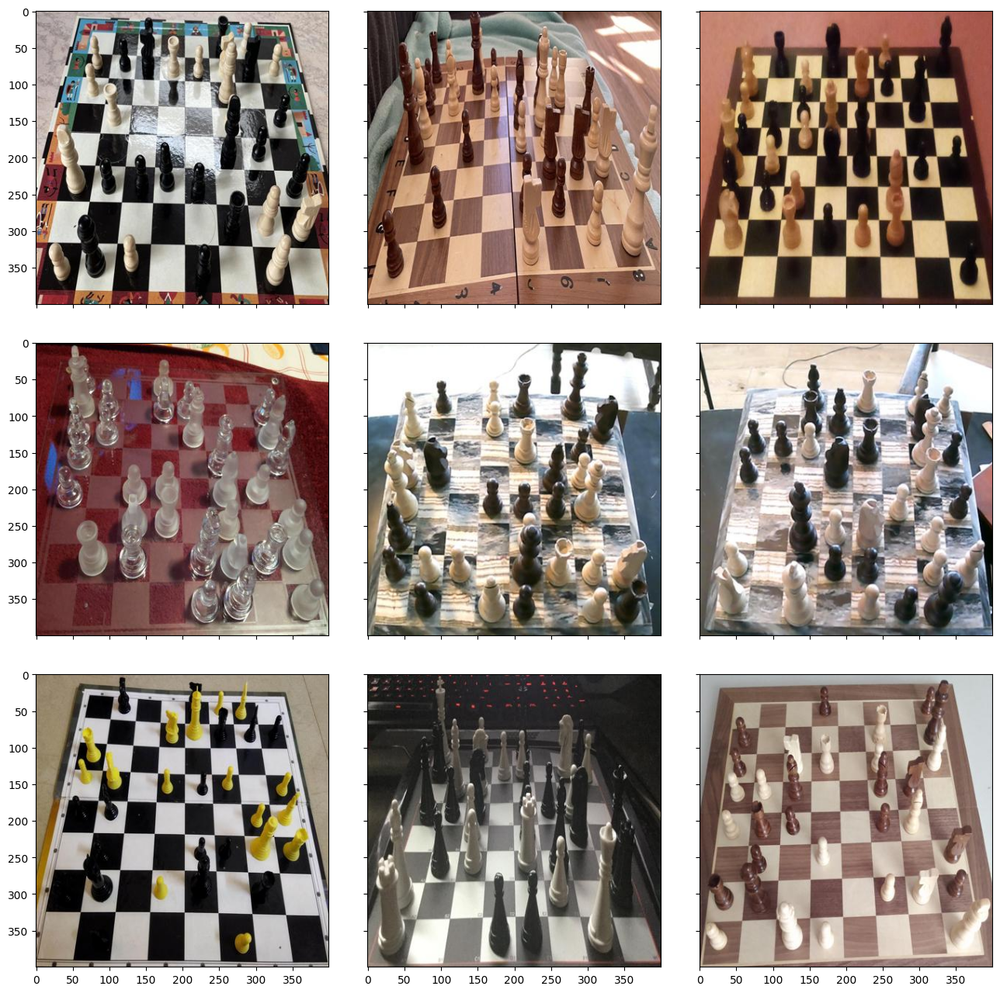

9505


In [4]:
show_images(REAL_DIR+"/*.jpeg")
print(len(glob.glob(REAL_DIR+"/*.jpeg")))

## Unity Data

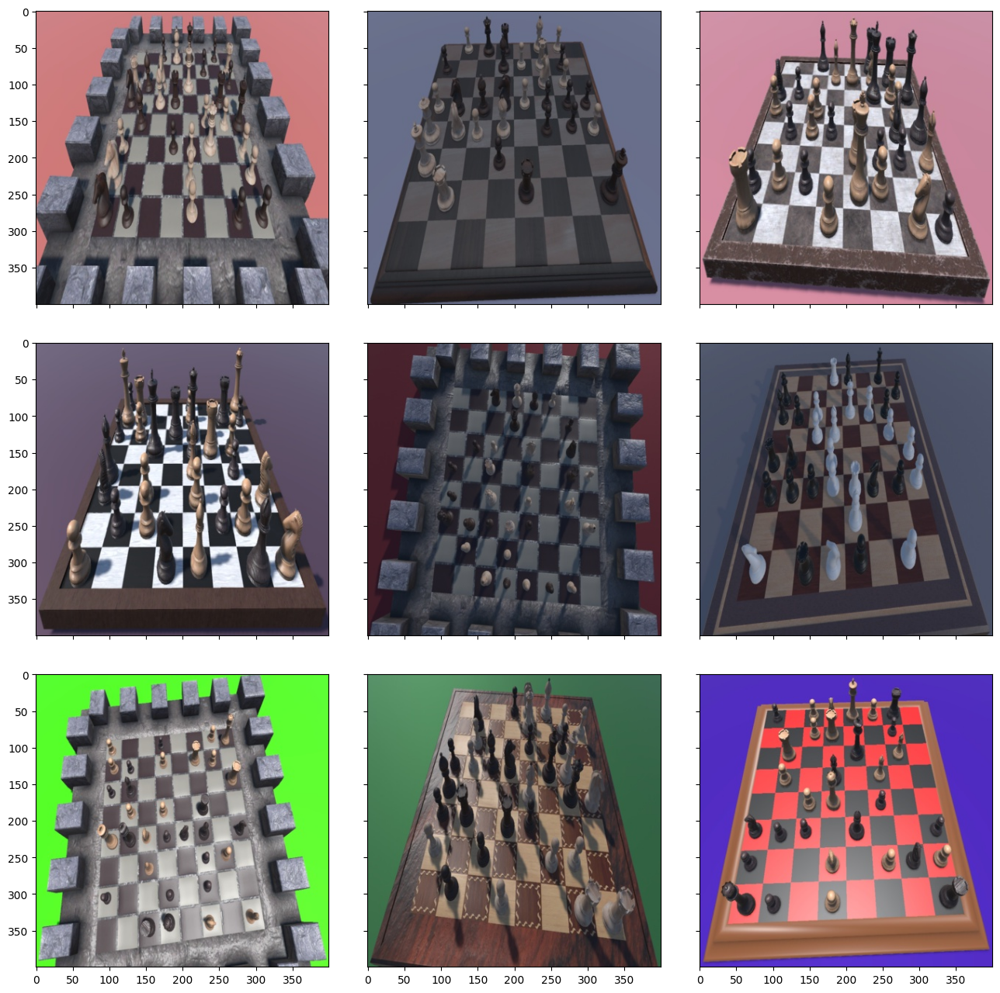

30000


In [5]:
show_images(UNITY_DIR+"/*.jpeg")
print(len(glob.glob(UNITY_DIR+"/*.jpeg")))

## Video Data

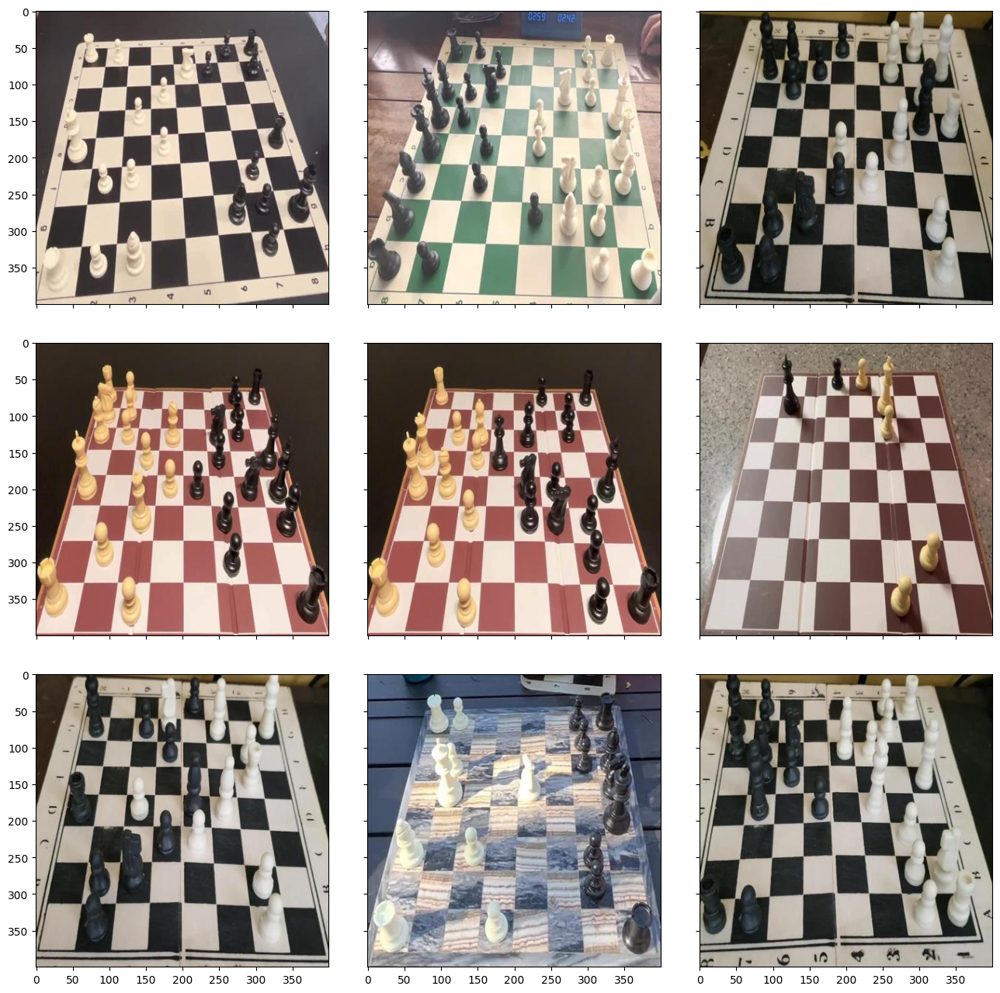

698


In [6]:
show_images(VIDEO_DIR+"/*.jpeg")
print(len(glob.glob(VIDEO_DIR+"/*.jpeg")))

# Dependencies

In [7]:
!pip install torch torchvision torchaudio chess pytorch-lightning

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 774.6/774.6 kB 36.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 805.2/805.2 kB 56.2 MB/s eta 0:00:00


# Dataset

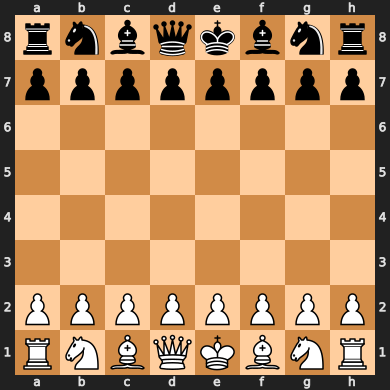

In [8]:
import os, random
import chess
import numpy as np
from pathlib import Path

class Board:

    def __init__(self, board):
        self.board = board

    @classmethod
    def from_file_name(cls, file_name):
        fen = Path(file_name).stem
        fen = fen.replace("-", "/") + " w KQkq - 0 1"
        board = chess.Board(fen=fen)
        return Board(board)

    @classmethod
    def from_array(cls, a):
        board = chess.Board()
        board.clear()
        for file in range(8):
            for rank in range(8):
                i = a[rank][file]
                if i == 0:
                    continue
                sq = (rank * 8) + file
                piece = Board.piece_from_int(i)
                board.set_piece_at(sq, piece)
        return Board(board)

    @classmethod
    def from_prediction(cls, y_hat):
        y_hat = torch.argmax(y_hat, dim=2)
        y_hat = torch.reshape(y_hat, (8, 8))
        return Board.from_array(y_hat.cpu().numpy())

    @classmethod
    def piece_to_int(cls, piece):
        if piece is None:
            return 0
        return piece.piece_type if piece.color else piece.piece_type + 6

    @classmethod
    def piece_from_int(cls, i):
        if i == 0:
            return None
        piece_type = ((i-1)%6)+1
        piece_color = chess.BLACK if i > 6 else chess.WHITE
        return chess.Piece(piece_type=piece_type, color=piece_color)

    def to_array(self):
        a = np.zeros((8,8), dtype=np.int8)
        for sq, piece in self.board.piece_map().items():
            file = sq % 8
            rank = sq // 8
            a[rank][file] = Board.piece_to_int(piece)
        return a

    def to_prediction(self):
        a = torch.zeros((64,13), dtype=torch.float)
        for sq, piece in self.board.piece_map().items():
            idx = Board.piece_to_int(piece)
            a[sq][idx] = 1.0
        return a

    def flip(self):
        cp = np.copy(self.to_array())
        flipped = np.fliplr(cp)
        return Board.from_array(flipped)

    def rotate(self, n):
        cp = np.copy(self.to_array())
        rotated = np.rot90(cp, k=4-n)
        return Board.from_array(rotated)

board = Board(chess.Board())
board = Board.from_array(board.to_array())
board.board

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:43: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


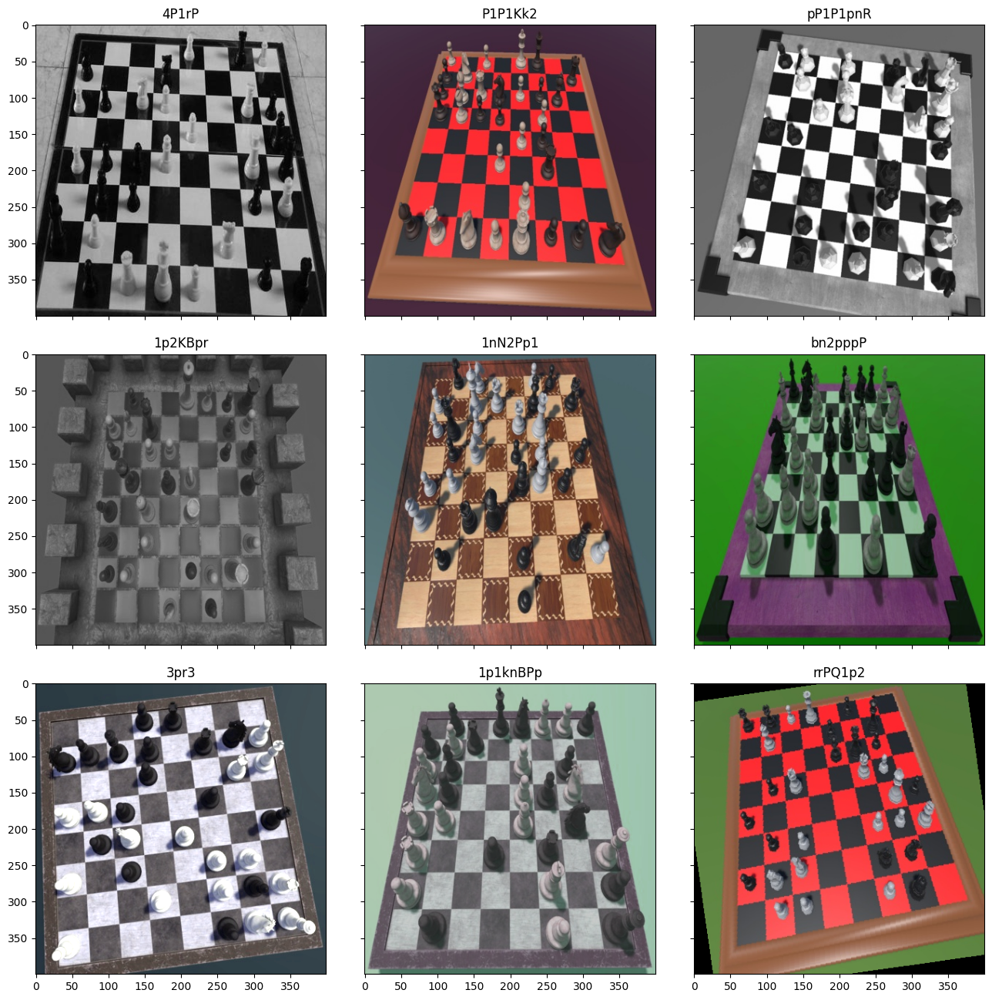

In [9]:
import os, glob, random
from enum import Enum
from PIL import Image, ImageOps
import torch
import torchvision.transforms.v2 as T
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

class PieceSet(Enum):
    # empty / piece
    Binary = 'binary'
    # empty / white / black
    Colors = 'colors'
    # empty / white minor / white major / black minor / black major
    MajorMinor = 'major-minor'
    # empty / white minor / white major / white royal / black minor / black major / black royal
    RoyalMajorMinor = 'royal-major-minor'
    # empty / pawn / knight / bishop / rook / queen / king
    ColorBlind = 'color-blind'
    # empty / white pawn / white knight / white bishop / white rook / white queen / white king / black pawn / black knight / black bishop / black rook / black queen / black king
    Full = 'full'

    def weights(self):
        if self == PieceSet.Binary:
            return torch.tensor([1.,1.])
        elif self == PieceSet.Colors:
            return torch.tensor([1.,2.,2.])
        elif self == PieceSet.ColorBlind:
            return torch.tensor([64/32,64/16,64/4,64/4,64/4,64/2,64/2])
        elif self == PieceSet.Full:
            return torch.tensor([64/32,64/8,64/2,64/2,64/2,64/1,64/1,64/8,64/2,64/2,64/2,64/1,64/1])

    def mapping(self):
        if self == PieceSet.Binary:
            return {"PNBRQKpnbrqk":1}
        elif self == PieceSet.Colors:
            return {"PNBRQK":1,"pnbrqk":2}
        elif self == PieceSet.MajorMinor:
            return {"P":1,"NBRQK":2,"p":3,"nbrqk":4}
        elif self == PieceSet.RoyalMajorMinor:
            return {"P":1,"NBR":2,"QK":3,"p":4,"nbr":5,"qk":6}
        elif self == PieceSet.ColorBlind:
            return {"Pp":1,"Nn":2,"Bb":3,"Rr":4,"Qq":5,"Kk":6}
        elif self == PieceSet.Full:
            return {"P":1,"N":2,"B":3,"R":4,"Q":5,"K":6,"p":7,"n":8,"b":9,"r":10,"q":11,"k":12}

    def transform_y(self, y):
        for symbol, value in self.mapping().items():
            for char in symbol:
                piece = chess.Piece.from_symbol(char)
                i = Board.piece_to_int(piece)
                y = np.where(y == i, value, y)
        return y

    def transform_y_hat(self, y_hat):
        empty = torch.unsqueeze(torch.sum(y_hat[:,0:1],1),1)
        elements = [empty]
        for symbol, value in self.mapping().items():
            element = None
            for char in symbol:
                piece = chess.Piece.from_symbol(char)
                i = Board.piece_to_int(piece)
                if element is None:
                    element = y_hat[:,i:i+1]
                else:
                    element = element + y_hat[:,i:i+1]
            elements.append(element)
        return torch.cat(elements, 1)

class BoardDataset(Dataset):

    def __init__(self, file_names, transform=None):
        self.file_names = file_names
        self.transform = transform

    def __len__(self):
        return len(self.file_names)

    def __getitem__(self, idx):
        file_name = self.file_names[idx]
        image = Image.open(file_name)
        board = Board.from_file_name(file_name)
        sample = {'image': image, 'board': board}
        if self.transform:
            sample = self.transform(sample)
        return sample

    def get_file_name(self, idx):
        return self.file_names[idx]

class FlipTransform(object):

    def __init__(self, probability=0.5):
        self.probability = probability

    def __call__(self, sample):
        image, board = sample['image'], sample['board']
        p = random.uniform(0, 1)
        flip = p <= self.probability
        if flip:
            image = ImageOps.mirror(image)
            board = board.flip()
        return {'image': image, 'board': board}

class ImageTransform(object):
    def __init__(self, f=None):
        self.f = f

    def __call__(self, sample):
        image, board = sample['image'], sample['board']
        if not self.f is None:
            image = self.f(image)
        return {'image': image, 'board': board}

class TensorTransform(object):

    def __init__(self, piece_sets=[PieceSet.Binary, PieceSet.Colors, PieceSet.ColorBlind, PieceSet.Full]):
        self.piece_sets = piece_sets
        self.preprocess = T.Compose([
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def __call__(self, sample):
        image, board = sample['image'], sample['board']
        t = self.preprocess(image.copy())
        result = {"image":t}
        board = board.to_array().flatten().astype(int)
        for pc in self.piece_sets:
            result[pc.value] = pc.transform_y(board)
        return result

random_color = T.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25, hue=0.25)
random_rot = T.RandomRotation(degrees=(-15,15))
random_perspective = T.RandomPerspective(distortion_scale=0.25, p=1.0)
random_geo = T.RandomChoice([random_rot,random_perspective])
image_transform = ImageTransform(f=T.Compose([
    T.RandomApply([random_geo], p=0.33),
    T.RandomApply([random_color], p=0.25),
    T.RandomApply([T.Grayscale(num_output_channels=3)], p=0.25),
]))
display_transform = transforms.Compose([
    image_transform,
    FlipTransform(),
])
train_transform = transforms.Compose([
    image_transform,
    FlipTransform(),
    TensorTransform(),
])
val_transform = transforms.Compose([
    TensorTransform(),
])

images = glob.glob(REAL_DIR+"/*.jpeg") + glob.glob(UNITY_DIR+"/*.jpeg")
random.shuffle(images)
train_images = images[:int(len(images)*0.9)]
val_images = images[int(len(images)*0.9):]

ds_display = BoardDataset(train_images, transform=display_transform)
ds_train = BoardDataset(train_images, transform=train_transform)
ds_val = BoardDataset(val_images, transform=val_transform)
ds_test = BoardDataset(glob.glob(VIDEO_DIR+"/*.jpeg"), transform=val_transform)

def display_dataset(dataset):
  fig = plt.figure(figsize=(16., 16.))
  grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(3, 3),  # creates 2x2 grid of axes
                 axes_pad=0.5,  # pad between axes in inch.
                 )
  for ax in grid:
    idx = random.randrange(0, len(dataset))
    item = dataset[idx]
    ax.imshow(item["image"])
    title = item["board"].board.fen()
    title = title.split("/")[0]
    ax.set_title(title)
  plt.show()

display_dataset(ds_display)

# Training

In [10]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs

<IPython.core.display.Javascript object>

In [15]:
!gsutil -m cp gs://chesspic-assets/models/2023-11-02-fenify-3d-efficientnet-v2-s-95-val-acc.ckpt .

Copying gs://chesspic-assets/models/2023-11-02-fenify-3d-efficientnet-v2-s-95-val-acc.ckpt...
==> NOTE: You are downloading one or more large file(s), which would
run significantly faster if you enabled sliced object downloads. This
feature is enabled by default but requires that compiled crcmod be
installed (see "gsutil help crcmod").

- [1/1 files][256.3 MiB/256.3 MiB] 100% Done                                    
Operation completed over 1 objects/256.3 MiB.                                    


In [16]:
import time
import pytorch_lightning as pl
import torchvision.models as models
from sklearn.model_selection import train_test_split
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import ConcatDataset

print(torch.__version__)
torch.cuda.empty_cache()

class Model(pl.LightningModule):

    def __init__(self, resnet=None, piece_sets=[PieceSet.Binary, PieceSet.Colors, PieceSet.ColorBlind, PieceSet.Full],
                 lr=0.0001, batch_size=8):
        super().__init__()
        self.piece_sets = piece_sets
        self.lr = lr
        self.batch_size = batch_size
        self.resnet = resnet
        self.outputs = nn.Linear(1000, 64*13)
        self.losses = nn.ModuleList()
        for pc in piece_sets:
            loss = nn.CrossEntropyLoss(weight=pc.weights())
            self.losses.append(loss)

    def forward(self, x):
        x = F.relu(self.resnet(x))
        x = self.outputs(x)
        x = torch.reshape(x, (x.shape[0], 64, 13))
        return F.softmax(x,dim=2)

    def training_step(self, batch, batch_idx):
        result = self.combined_loss(batch)
        return result["loss"]

    def validation_step(self, batch, batch_idx):
        return self.combined_loss(batch, prefix="val_")

    def test_step(self, batch, batch_idx):
        return self.combined_loss(batch, prefix="test_")

    def combined_loss(self, batch, prefix=""):
        x = batch['image']
        output = self(x)
        loss = torch.tensor([0.]).cuda()
        results = {}
        for i, pc in enumerate(self.piece_sets):
            # loss
            y = batch[pc.value]
            y = torch.flatten(y, end_dim=1)
            y_hat = output
            y_hat = torch.flatten(y_hat, end_dim=1)
            y_hat = pc.transform_y_hat(y_hat)
            pc_loss = self.losses[i](y_hat, y) # / pc.prediction_count()
            loss += pc_loss
            # accuracy
            prediction = torch.argmax(y_hat, dim=1)
            correct = torch.sum((y == prediction).float())
            accuracy = correct / prediction.shape[0]
            results[prefix + pc.value + "_loss"] = pc_loss
            results[prefix + pc.value + "_accuracy"] = accuracy
            self.log(prefix + pc.value + "_loss", pc_loss)
            self.log(prefix + pc.value + "_accuracy", accuracy, prog_bar=True)
        results[prefix +'loss'] = loss
        self.log(prefix + "loss", loss, prog_bar=True)
        return results

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.lr)

    def train_dataloader(self):
        return DataLoader(dataset=ds_train, batch_size=self.batch_size, shuffle=True, num_workers=2)

    def val_dataloader(self):
        return DataLoader(dataset=ds_val, batch_size=self.batch_size, shuffle=False, num_workers=2)

    def test_dataloader(self):
        return DataLoader(dataset=ds_test, batch_size=self.batch_size, shuffle=False, num_workers=2)

# hyperparams
PIECE_SETS = [PieceSet.Binary, PieceSet.Colors, PieceSet.ColorBlind, PieceSet.Full]
RESNET = models.efficientnet_v2_s(weights=models.EfficientNet_V2_S_Weights.DEFAULT)
logger = pl.loggers.TensorBoardLogger(save_dir="lightning_logs", name="chesspic")
model = Model(resnet=RESNET, piece_sets=PIECE_SETS,lr=0.0001, batch_size=32)
use_checkpoint = True
if use_checkpoint:
  checkpoint = torch.load('/content/2023-11-02-fenify-3d-efficientnet-v2-s-95-val-acc.ckpt')
  model.load_state_dict(checkpoint['state_dict'], strict=False)
trainer = pl.Trainer(max_epochs=300,logger=logger, precision=16)
trainer.fit(model)

2.1.0+cu118


/usr/local/lib/python3.10/dist-packages/lightning_fabric/connector.py:565: `precision=16` is supported for historical reasons but its usage is discouraged. Please set your precision to 16-mixed instead!
INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type         | Params
-----------------------------------------
0 | resnet  | EfficientNet | 21.5 M
1 | outputs | Linear       | 832 K 
2 | losses  | ModuleList   | 0     
-----------------------------------------
22.3 M    Trainable params


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/call.py:54: Detected KeyboardInterrupt, attempting graceful shutdown...


# Testing

In [75]:
trainer.test(model, dataloaders=[DataLoader(dataset=ds_val, batch_size=16, shuffle=False, num_workers=2)])

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│   test_binary_accuracy    │    0.9050188660621643     │
│     test_binary_loss      │    0.4077298939228058     │
│ test_color-blind_accuracy │    0.8641654849052429     │
│   test_color-blind_loss   │    1.2804793119430542     │
│   test_colors_accuracy    │    0.8867523670196533     │
│     test_colors_loss      │    0.6487077474594116     │
│    test_full_accuracy     │    0.8517640233039856     │
│      test_full_loss       │    1.8539220094680786     │
│         test_loss         │     4.190838813781738     │
└───────────────────────────┴───────────────────────────┘

[{'test_binary_loss': 0.4077298939228058,
  'test_binary_accuracy': 0.9050188660621643,
  'test_colors_loss': 0.6487077474594116,
  'test_colors_accuracy': 0.8867523670196533,
  'test_color-blind_loss': 1.2804793119430542,
  'test_color-blind_accuracy': 0.8641654849052429,
  'test_full_loss': 1.8539220094680786,
  'test_full_accuracy': 0.8517640233039856,
  'test_loss': 4.190838813781738}]

In [80]:
from functools import reduce
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

model.eval()

bin_matrix = torch.zeros(2, 2, dtype=int)
colors_matrix = torch.zeros(3, 3, dtype=int)
blind_matrix = torch.zeros(7, 7, dtype=int)
full_matrix = torch.zeros(13, 13, dtype=int)
for idx in range(0, len(ds_val)):
  sample = ds_val[idx]
  x, y_bin, y_color, y_blind, y_full = sample["image"], sample["binary"], sample["colors"], sample["color-blind"], sample["full"]
  y_hat = model(torch.unsqueeze(x, 0))
  y_hat = torch.flatten(y_hat, end_dim=1)
  # bin
  y_hat_bin = PieceSet.Binary.transform_y_hat(y_hat)
  y_hat_bin = torch.argmax(y_hat_bin, dim=1)
  bin_matrix = bin_matrix + confusion_matrix(y_bin, y_hat_bin)
  # color
  y_hat_color = PieceSet.Colors.transform_y_hat(y_hat)
  y_hat_color = torch.argmax(y_hat_color, dim=1)
  colors_matrix = colors_matrix + confusion_matrix(y_color, y_hat_color)
  # color-blind
  y_hat_blind = PieceSet.ColorBlind.transform_y_hat(y_hat)
  y_hat_blind = torch.argmax(y_hat_blind, dim=1)
  blind_matrix = blind_matrix + confusion_matrix(y_blind, y_hat_blind)
  # full
  y_hat_full = PieceSet.Full.transform_y_hat(y_hat)
  y_hat_full = torch.argmax(y_hat_full, dim=1)
  full_matrix = full_matrix + confusion_matrix(y_full, y_hat_full)

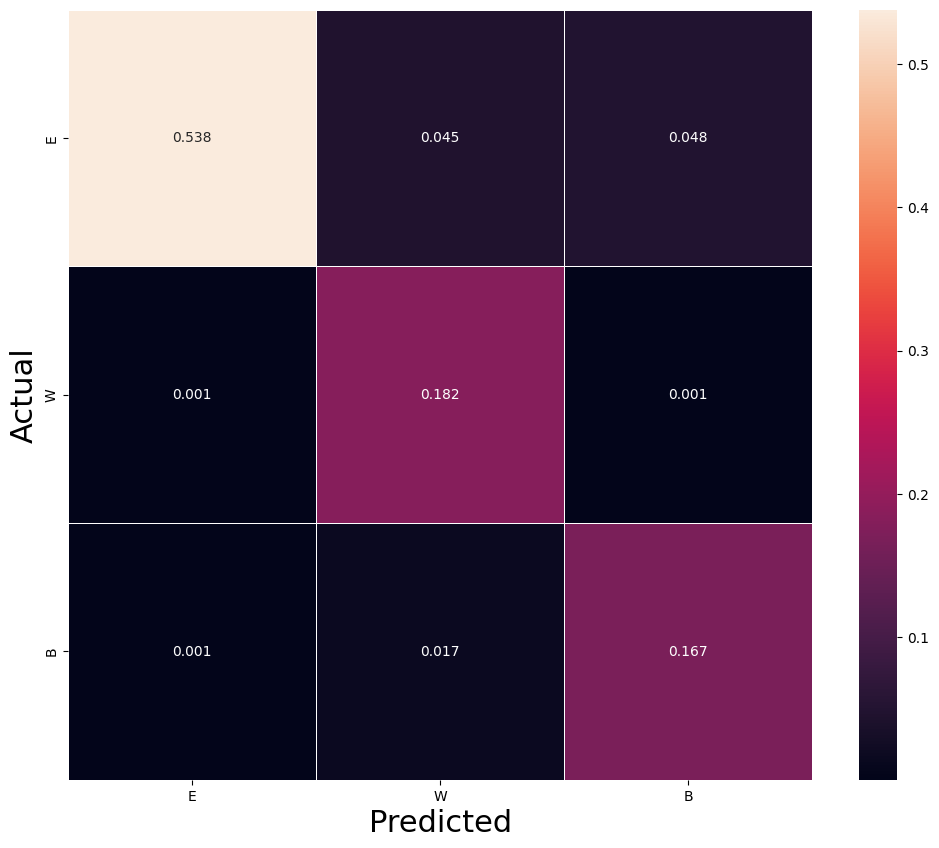

In [82]:
from matplotlib.colors import LogNorm, Normalize

fig, ax = plt.subplots(figsize=(12, 10))
# full_matrix[0][0] = 0.0
display_matrix = colors_matrix / torch.sum(colors_matrix)
sn.heatmap(display_matrix, annot=True, linewidth=.5, fmt=".3f")
plt.yticks(np.arange(3)+0.5,('E','W','B'), fontsize="10")
plt.xticks(np.arange(3)+0.5,('E','W','B'), fontsize="10" )
plt.xlabel('Predicted',fontsize=22)
plt.ylabel('Actual',fontsize=22)
plt.show()

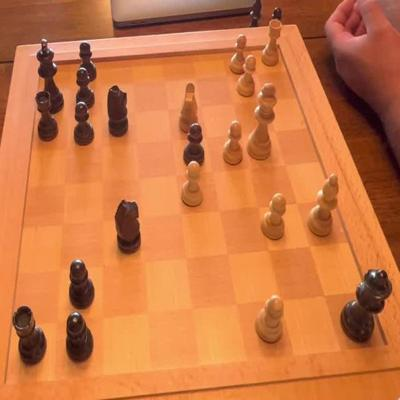

Actual


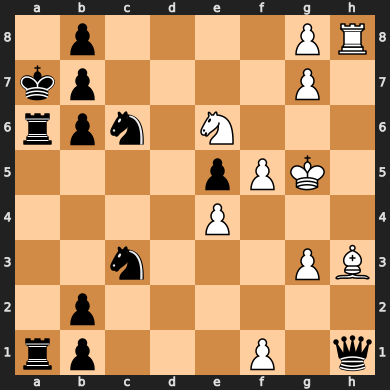

Prediction


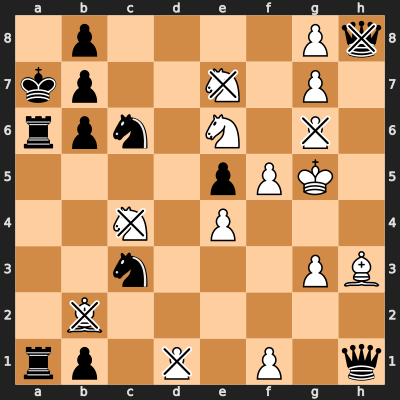

Accuracy  90.625


In [90]:
from IPython.display import SVG

def compare_boards_and_mark_differences(predicted_board, actual_board):
    """
    This function takes two chess.Board() objects, 'predicted_board' and 'actual_board',
    and returns an SVG image of the 'predicted_board' with 'X' marks on the squares that
    differ from the 'actual_board'.
    """

    # Initialize a SquareSet for the squares to mark
    squares_to_mark = chess.SquareSet()

    # Compare piece positions between both boards and record differences
    for square in chess.SQUARES:
        predicted_piece = predicted_board.piece_at(square)
        actual_piece = actual_board.piece_at(square)
        if predicted_piece != actual_piece:
            squares_to_mark.add(square)

    # Create an SVG drawing of the predicted board with the marked differences
    board_svg = chess.svg.board(board=predicted_board, squares=squares_to_mark, size=400)

    return board_svg

def inference(model, file, y):
    output = {"file":file}
    y_t = torch.tensor(y['full']).cuda()
    y_t = torch.reshape(y_t, (8, 8))
    y_board = Board.from_array(y_t.cpu().numpy())
    output["y_board"] = y_board

    img = y['image']
    img_batch = torch.unsqueeze(img, 0)
    y_hat = model(img_batch).data
    y_hat = torch.squeeze(y_hat)
    y_hat_board = torch.argmax(y_hat, dim=1)
    y_hat_board = torch.reshape(y_hat_board, (8, 8))
    y_hat_board = Board.from_array(y_hat_board.cpu().numpy())
    output["y_hat_board"] = y_hat_board
    return output

def show_examples(model, dataset, n=2):
  for i in range(n):
    rand_idx = np.random.randint(0, len(dataset))
    file_path = dataset.get_file_name(rand_idx)
    output = inference(model, file_path, dataset[rand_idx])
    im = Image.open(output["file"])
    display(im)
    y_board = output["y_board"]
    y_hat_board = output["y_hat_board"]
    print("Actual")
    display(y_board.board)
    print("Prediction")
    display(SVG(compare_boards_and_mark_differences(y_hat_board.board, y_board.board)))
    correct = np.sum(((y_board.to_array()-y_hat_board.to_array()) == 0).astype(int))
    print("Accuracy ", (correct / 64.0) * 100)
show_examples(model, ds_val, n=1)

In [79]:
input = torch.randn(1, 3, 400, 400)
traced_model = torch.jit.trace(model, input)
traced_model.save("2023-11-02-fenify-3d-efficientnet-v2-s-95-val-acc.pt")